<a href="https://colab.research.google.com/github/VedantiWandile/Rock-vs-Mine-prediction/blob/main/Rock_vs_Mine_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Importing the dependencies

In [3]:
import numpy as np #used to create numpy arrays
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score #used to find the accuracy of the model

Data collection and Data processing

In [5]:
# loading a dataset to a pandas dataframe
sonar_data = pd.read_csv("D:\DS_March\Rock-vs-Mine-prediction\sonar.csv", header=None)

In [6]:
sonar_data.head()

,0,1,2,3,4,5,6,7,8,9,...,51,52,53,54,55,56,57,58,59,60
0,0.0200,0.0371,0.0428,0.0207,0.0954,0.0986,0.1539,0.1601,0.3109,0.2111,...,0.0027,0.0065,0.0159,0.0072,0.0167,0.0180,0.0084,0.0090,0.0032,R
1,0.0453,0.0523,0.0843,0.0689,0.1183,0.2583,0.2156,0.3481,0.3337,0.2872,...,0.0084,0.0089,0.0048,0.0094,0.0191,0.0140,0.0049,0.0052,0.0044,R
2,0.0262,0.0582,0.1099,0.1083,0.0974,0.2280,0.2431,0.3771,0.5598,0.6194,...,0.0232,0.0166,0.0095,0.0180,0.0244,0.0316,0.0164,0.0095,0.0078,R
3,0.0100,0.0171,0.0623,0.0205,0.0205,0.0368,0.1098,0.1276,0.0598,0.1264,...,0.0121,0.0036,0.0150,0.0085,0.0073,0.0050,0.0044,0.0040,0.0117,R
4,0.0762,0.0666,0.0481,0.0394,0.0590,0.0649,0.1209,0.2467,0.3564,0.4459,...,0.0031,0.0054,0.0105,0.0110,0.0015,0.0072,0.0048,0.0107,0.0094,R


In [7]:
# number of rows and columns
sonar_data.shape

(208, 61)

In [8]:
sonar_data.describe() #describe gives statistical measures of the data

,0,1,2,3,4,5,6,7,8,9,...,50,51,52,53,54,55,56,57,58,59
count,208.000000,208.000000,208.000000,208.000000,208.000000,208.000000,208.000000,208.000000,208.000000,208.000000,...,208.000000,208.000000,208.000000,208.000000,208.000000,208.000000,208.000000,208.000000,208.000000,208.000000
mean,0.029164,0.038437,0.043832,0.053892,0.075202,0.104570,0.121747,0.134799,0.178003,0.208259,...,0.016069,0.013420,0.010709,0.010941,0.009290,0.008222,0.007820,0.007949,0.007941,0.006507
std,0.022991,0.032960,0.038428,0.046528,0.055552,0.059105,0.061788,0.085152,0.118387,0.134416,...,0.012008,0.009634,0.007060,0.007301,0.007088,0.005736,0.005785,0.006470,0.006181,0.005031
min,0.001500,0.000600,0.001500,0.005800,0.006700,0.010200,0.003300,0.005500,0.007500,0.011300,...,0.000000,0.000800,0.000500,0.001000,0.000600,0.000400,0.000300,0.000300,0.000100,0.000600
25%,0.013350,0.016450,0.018950,0.024375,0.038050,0.067025,0.080900,0.080425,0.097025,0.111275,...,0.008425,0.007275,0.005075,0.005375,0.004150,0.004400,0.003700,0.003600,0.003675,0.003100
50%,0.022800,0.030800,0.034300,0.044050,0.062500,0.092150,0.106950,0.112100,0.152250,0.182400,...,0.013900,0.011400,0.009550,0.009300,0.007500,0.006850,0.005950,0.005800,0.006400,0.005300
75%,0.035550,0.047950,0.057950,0.064500,0.100275,0.134125,0.154000,0.169600,0.233425,0.268700,...,0.020825,0.016725,0.014900,0.014500,0.012100,0.010575,0.010425,0.010350,0.010325,0.008525
max,0.137100,0.233900,0.305900,0.426400,0.401000,0.382300,0.372900,0.459000,0.682800,0.710600,...,0.100400,0.070900,0.039000,0.035200,0.044700,0.039400,0.035500,0.044000,0.036400,0.043900


In [9]:
sonar_data[60].value_counts() # gives how many rocks and mines are there

60
M    111
R     97
Name: count, dtype: int64

M -> Mine

R -> Rock

In [11]:
sonar_data.groupby(60).mean()

,0,1,2,3,4,5,6,7,8,9,...,50,51,52,53,54,55,56,57,58,59
60,,,,,,,,,,,,,,,,,,,,,
M,0.034989,0.045544,0.050720,0.064768,0.086715,0.111864,0.128359,0.149832,0.213492,0.251022,...,0.019352,0.016014,0.011643,0.012185,0.009923,0.008914,0.007825,0.009060,0.008695,0.006930
R,0.022498,0.030303,0.035951,0.041447,0.062028,0.096224,0.114180,0.117596,0.137392,0.159325,...,0.012311,0.010453,0.009640,0.009518,0.008567,0.007430,0.007814,0.006677,0.007078,0.006024


### Data PreProcessing

In [13]:
for i in sonar_data.columns:
    print(type(i))

<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>
<class 'int'>


In [14]:
from sklearn.preprocessing import LabelEncoder

In [15]:
label = LabelEncoder()

In [16]:
sonar_data[60] = label.fit_transform(sonar_data[60])

In [17]:
sonar_data[60].value_counts() # gives how many rocks and mines are there

60
0    111
1     97
Name: count, dtype: int64

In [18]:
import seaborn as sns
import matplotlib.pyplot as plt

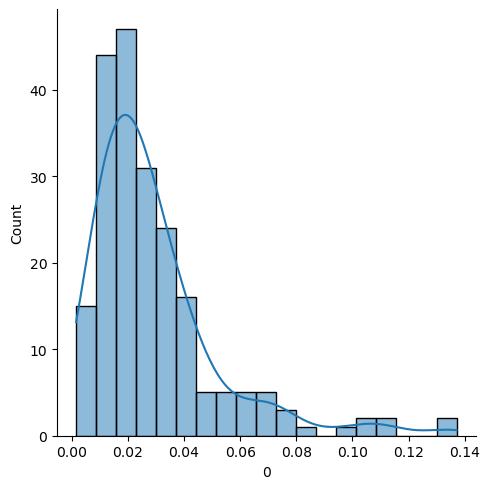

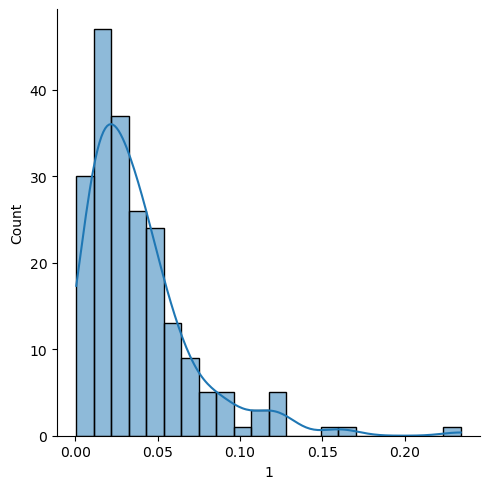

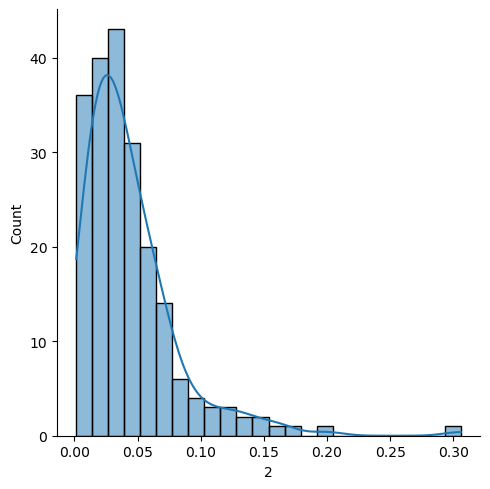

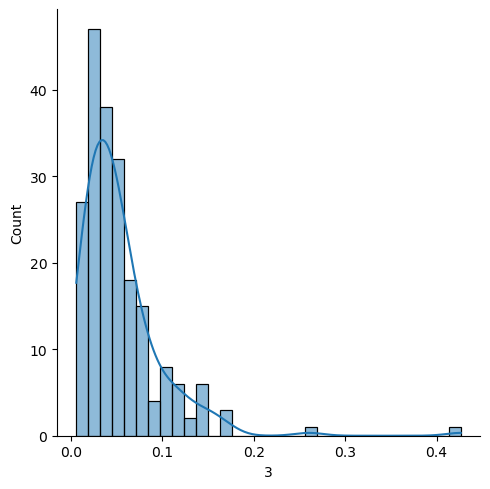

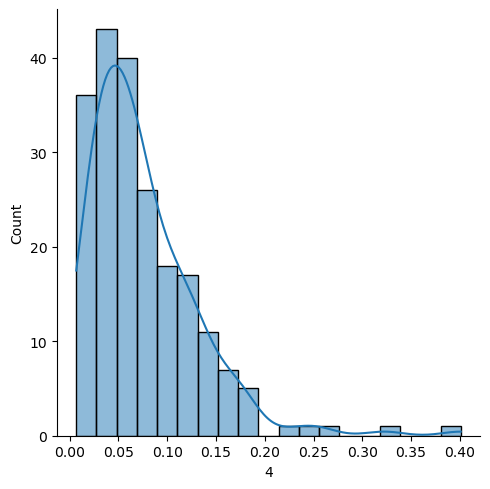

...

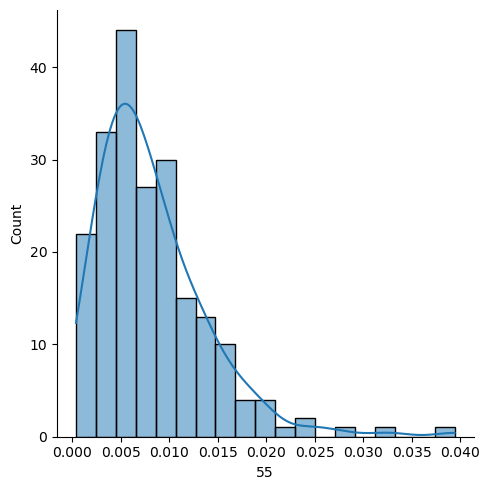

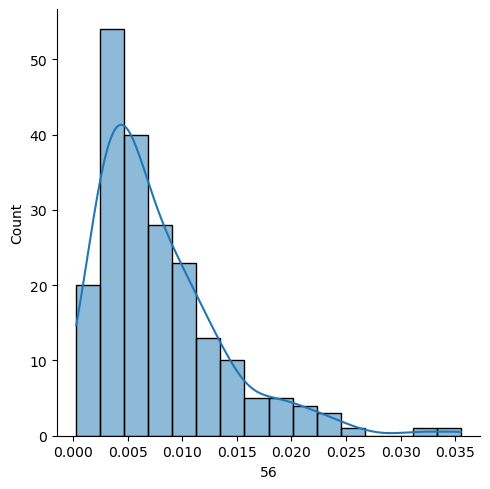

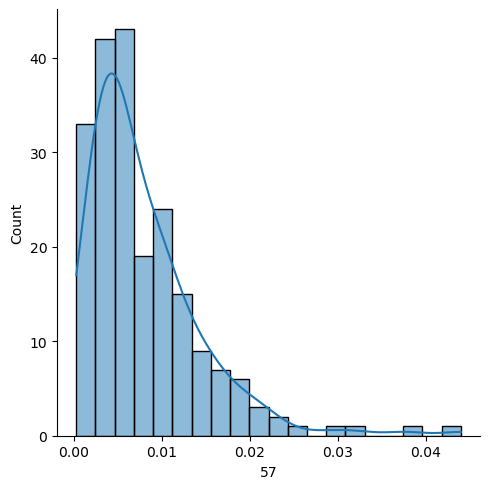

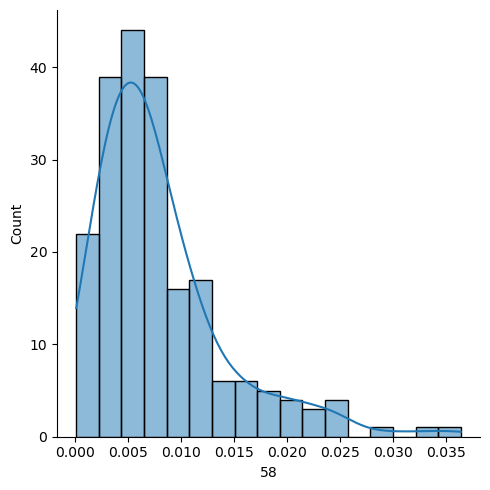

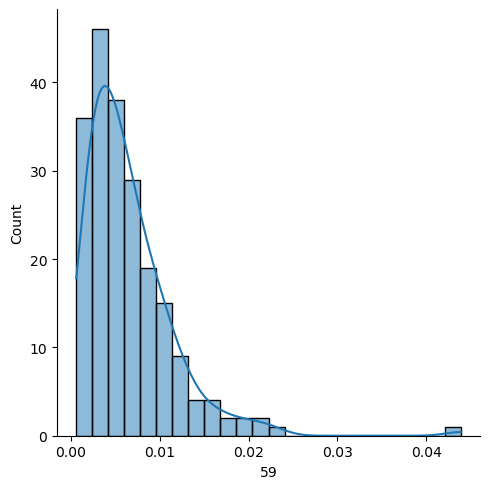

In [19]:
for i in range(0,60):
    sns.displot(x = sonar_data[i], kde = True)
    plt.show()

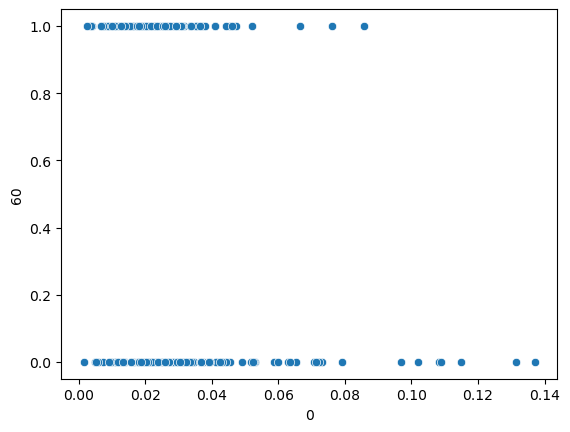

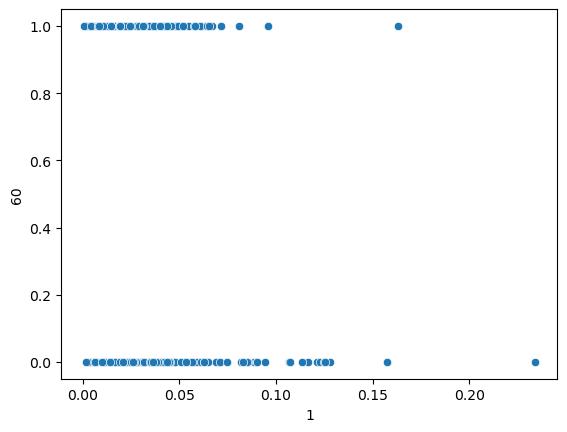

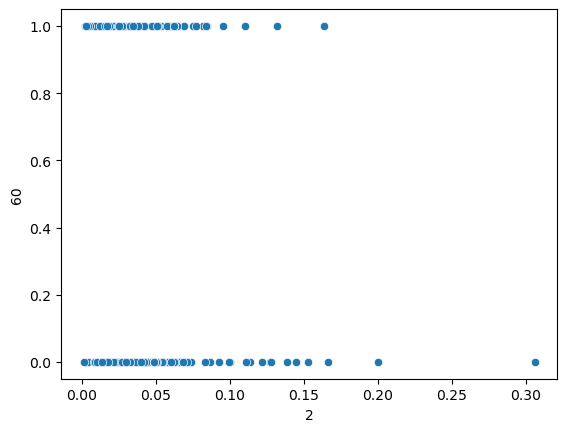

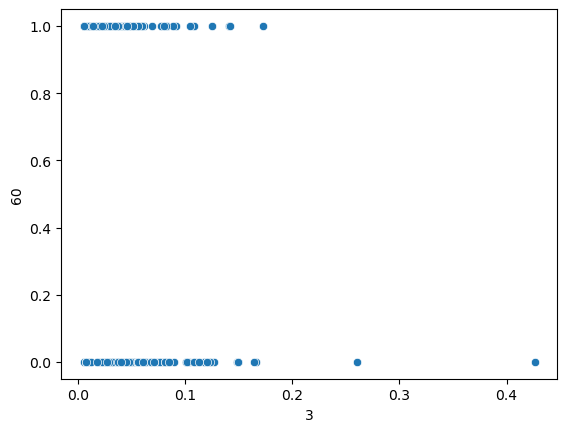

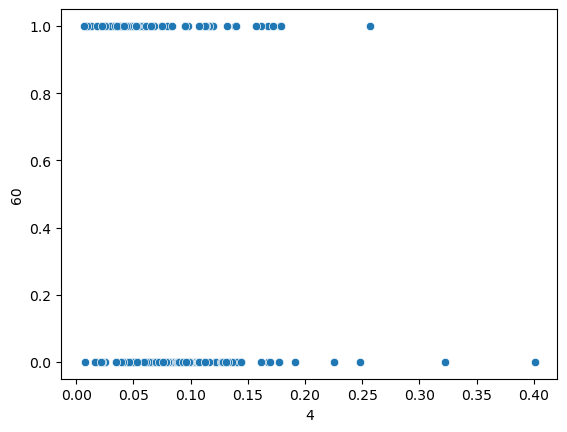

...

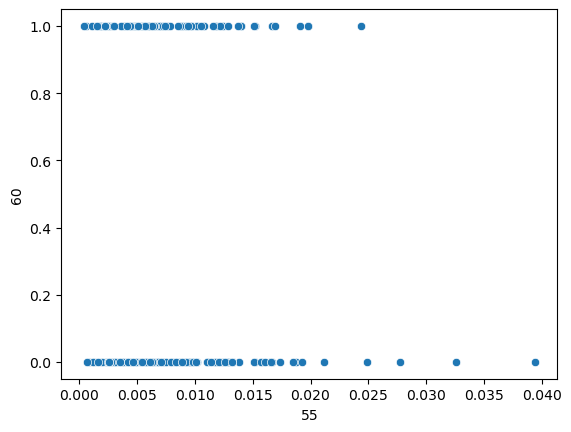

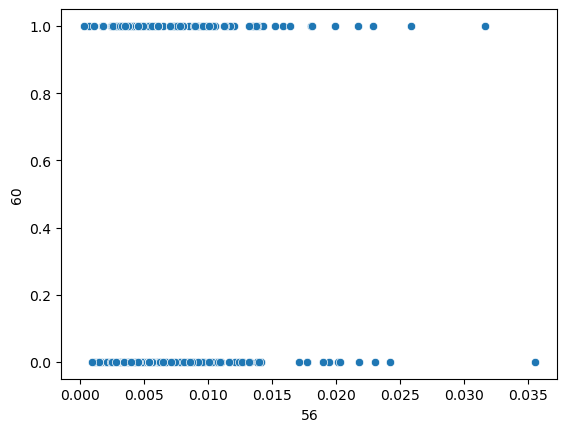

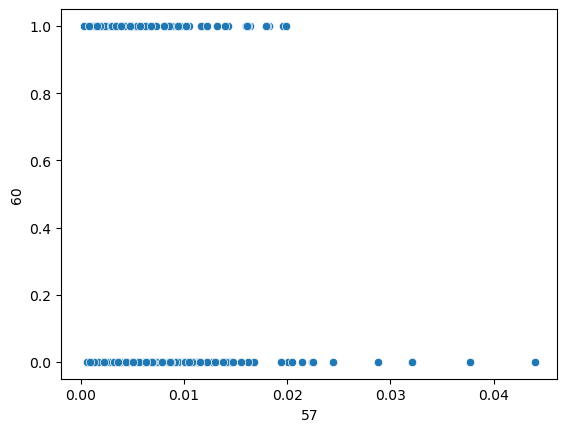

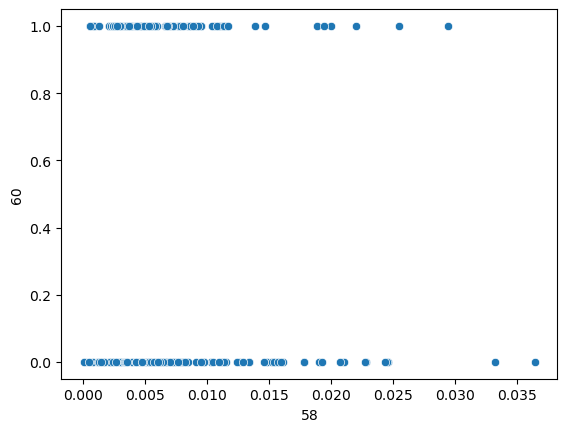

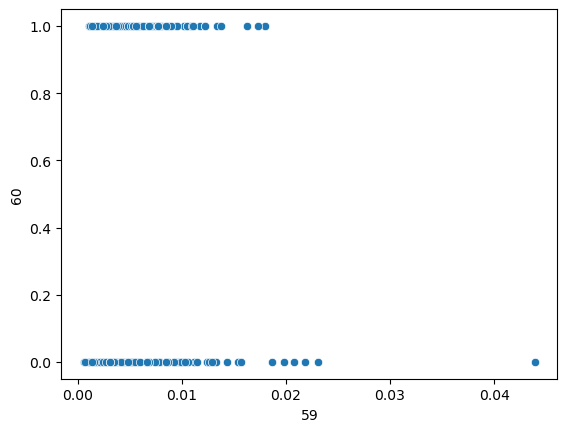

In [20]:
for i in range(0,60):
    sns.scatterplot(x = i, y = sonar_data[60], data = sonar_data)
    plt.show()

In [21]:
plt.figure(figsize=(100, 100))
sns.heatmap(data = sonar_data, fmt = '0.2f', annot = True)

<Axes: >

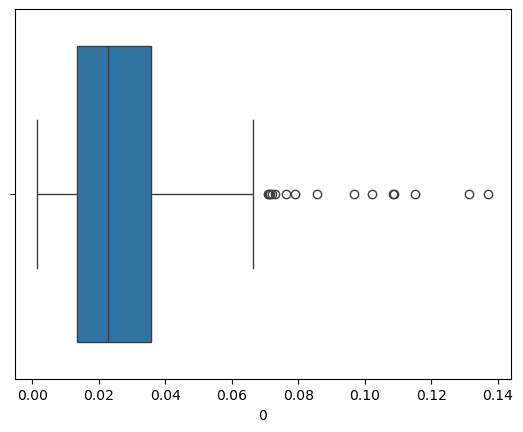

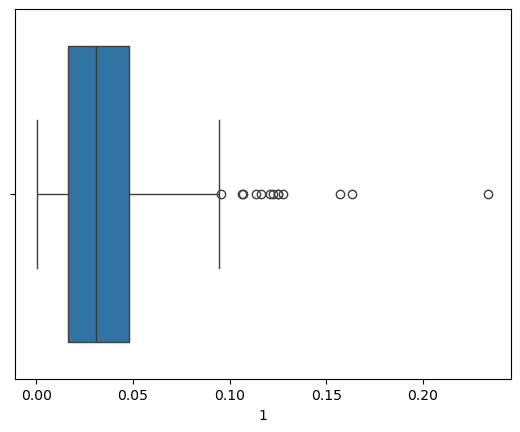

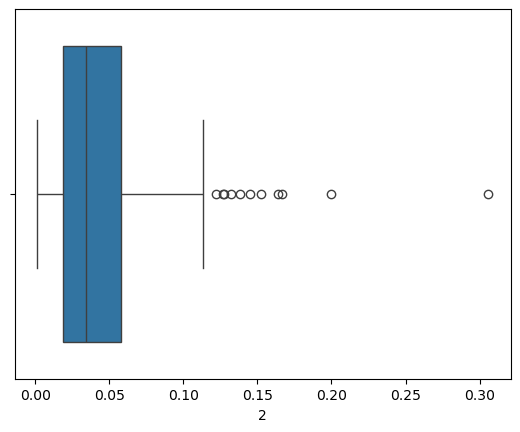

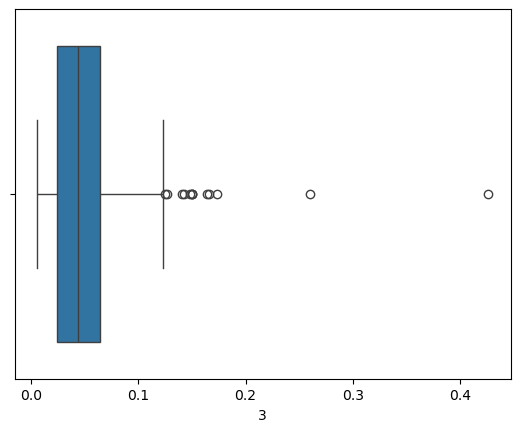

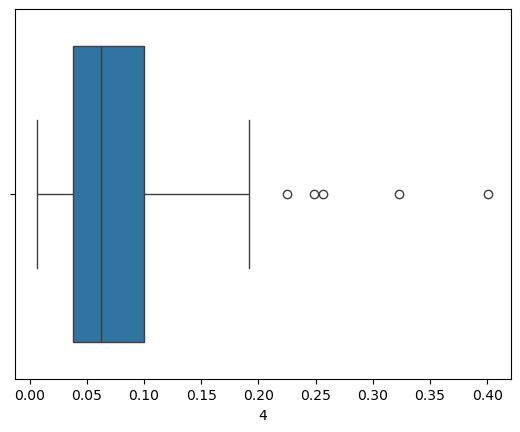

...

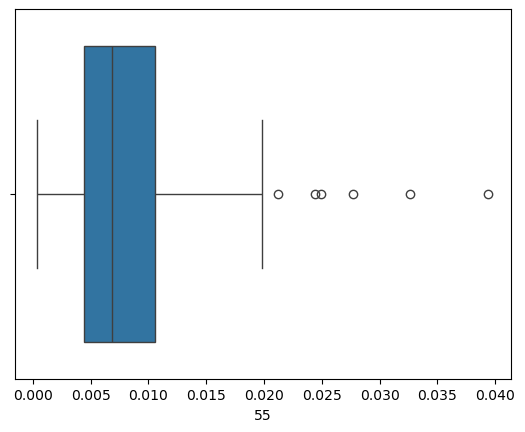

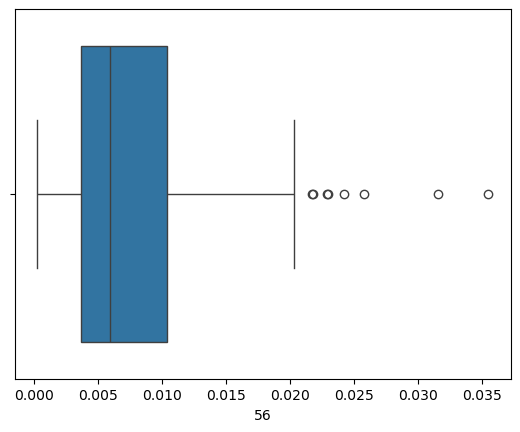

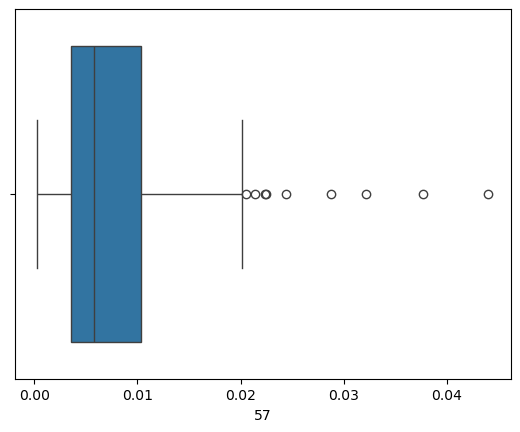

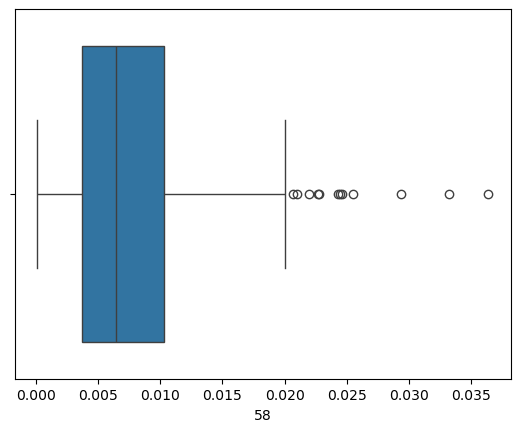

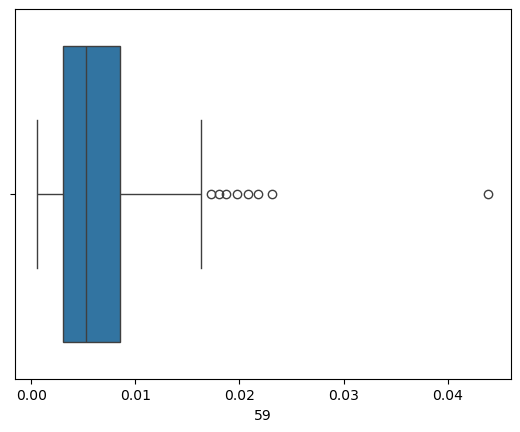

In [22]:
for i in range(0,60):
    sns.boxplot(x = i, data = sonar_data)
    plt.show()

#### Handling Outliers Using IQR method

In [24]:
for i in sonar_data.columns:
    q1 = sonar_data[i].quantile(0.25)
    q3 = sonar_data[i].quantile(0.75)
    iqr = q3 - q1

    lwr_bnd = q1 - 1.5*iqr
    upr_bnd = q3 + 1.5*iqr

    sonar_data.loc[:, i] = sonar_data[i].mask((sonar_data[i] < lwr_bnd) | (sonar_data[i] > upr_bnd), np.nan)


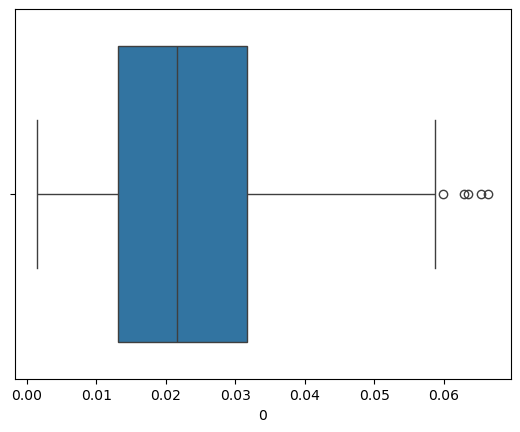

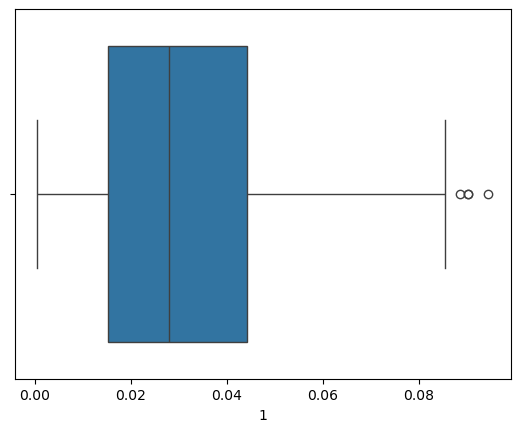

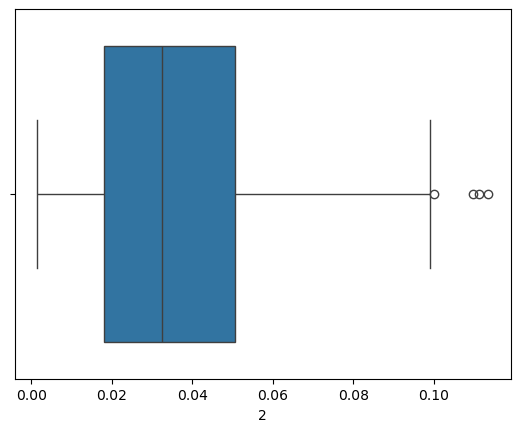

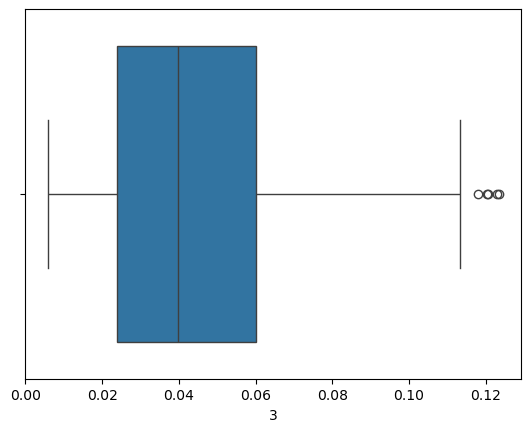

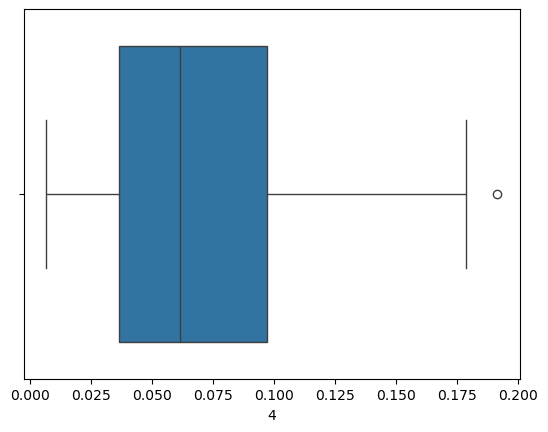

...

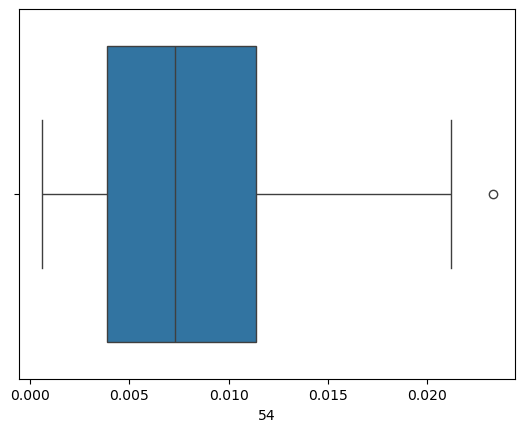

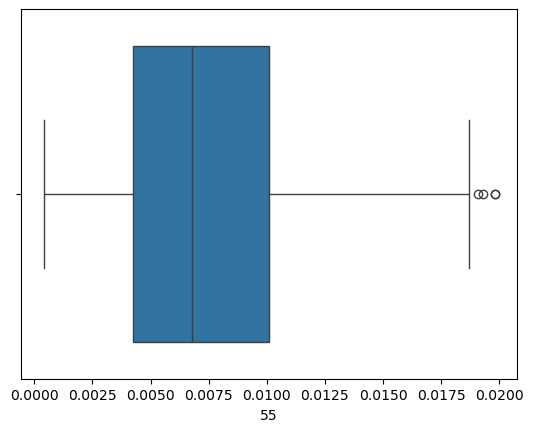

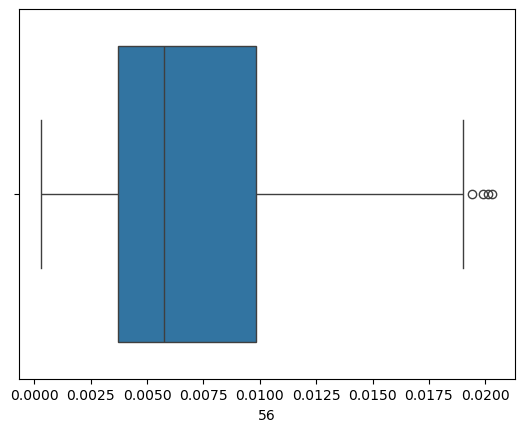

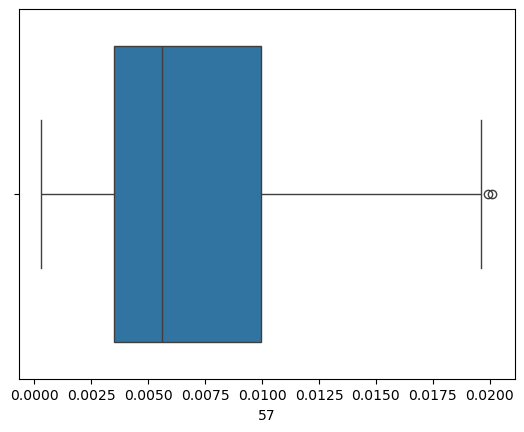

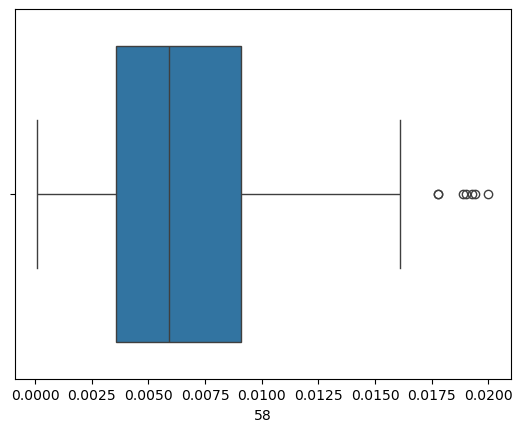

In [ ]:
for i in range(0,60):
    sns.boxplot(x = i, data = sonar_data)
    plt.show()

In [ ]:
sonar_data.isnull().sum()

In [ ]:
for i in range(0,60):
    sonar_data[i] = sonar_data[i].fillna(sonar_data[i].median())

In [ ]:
sonar_data.isnull().sum()

In [ ]:
#seperating data and labels
X = sonar_data.drop(columns=60, axis=1)
Y = sonar_data[60]

In [ ]:
print(X)
print(Y)

Training and Test data

In [ ]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.15, stratify=Y, random_state=1)

In [ ]:
print(X.shape, X_train.shape, X_test.shape)

In [ ]:
print(X_train)
print(Y_train)

Model Training -> Ensemble Learning

In [ ]:
# Import necessary libraries
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score,f1_score
from sklearn.ensemble import RandomForestClassifier

# Logistic Regression
log_reg = LogisticRegression(solver='liblinear')
log_reg.fit(X_train, Y_train)
Y_pred_log_reg = log_reg.predict(X_test)
log_reg_accuracy = accuracy_score(Y_test, Y_pred_log_reg)
log_reg_f1 = f1_score(Y_test, Y_pred_log_reg)

print("Logistic Regression Accuracy:", log_reg_accuracy,"F1 Score",log_reg_f1)

# Support Vector Machine (SVM)
svm = SVC()
svm.fit(X_train, Y_train)
Y_pred_svm = svm.predict(X_test)
svm_accuracy = accuracy_score(Y_test, Y_pred_svm)
svm_f1 = f1_score(Y_test, Y_pred_svm)
print("Support Vector Machine Accuracy:", svm_accuracy,"F1 Score", svm_f1)

# Decision Tree Classifier
dec_tree = DecisionTreeClassifier()
dec_tree.fit(X_train, Y_train)
Y_pred_dec_tree = dec_tree.predict(X_test)
dec_tree_accuracy = accuracy_score(Y_test, Y_pred_dec_tree)
dec_tree_f1 = f1_score(Y_test, Y_pred_dec_tree)
print("Decision Tree Classifier Accuracy:", dec_tree_accuracy,"F1 Score", dec_tree_f1)

# K-Nearest Neighbors (KNN) Classifier
knn = KNeighborsClassifier()
knn.fit(X_train, Y_train)
Y_pred_knn = knn.predict(X_test)
knn_accuracy = accuracy_score(Y_test, Y_pred_knn)
knn_f1 = f1_score(Y_test, Y_pred_knn)
print("K-Nearest Neighbors Classifier Accuracy:", knn_accuracy,"F1 Score", knn_f1)


# Random Forest Classifier
rfc = RandomForestClassifier()
rfc.fit(X_train,Y_train)
Y_pred_rfc = rfc.predict(X_test)
rfc_accuracy = accuracy_score(Y_test, Y_pred_rfc)
rfc_f1 = f1_score(Y_test, Y_pred_rfc)
print("Random Forest Classifier Accuracy:", rfc_accuracy,"F1 Score", rfc_f1)

### Random Forest Classifier gives best result

#### Making a predictive system

In [ ]:
input_data = (0.1313,0.2339,0.3059,0.4264,0.4010,0.1791,0.1853,0.0055,0.1929,0.2231,0.2907,0.2259,0.3136,0.3302,0.3660,0.3956,0.4386,0.4670,0.5255,0.3735,0.2243,0.1973,0.4337,0.6532,0.5070,0.2796,0.4163,0.5950,0.5242,0.4178,0.3714,0.2375,0.0863,0.1437,0.2896,0.4577,0.3725,0.3372,0.3803,0.4181,0.3603,0.2711,0.1653,0.1951,0.2811,0.2246,0.1921,0.1500,0.0665,0.0193,0.0156,0.0362,0.0210,0.0154,0.0180,0.0013,0.0106,0.0127,0.0178,0.0231)
#changing the input data to a numpy array
input_data_as_numpy_array = np.asarray(input_data)

#reshape the np array as we are predicting for one instance
input_data_reshaped = input_data_as_numpy_array.reshape(1,-1)

prediction = rfc.predict(input_data_reshaped)
print(prediction)

if (prediction[0]=='R'):
  print('The object is a Rock')
else:
  print('The object is a Mine')